# Personas within Parameters: Fine-Tuning Small Language Models with Low-Rank Adapters to Mimic User Behaviors

## METHODOLOGY
For distillation and persona generation, we utilize GPT-4o to generate Ms and Ml

*PS* We cannot afford gpt-4o so we will use an open source equivalent

# Setting up our LLM

### Environment Setup
Before running this notebook, ensure you have Ollama installed and running on your local machine:

1. **Install Ollama:** `brew install ollama` (macOS) or download from [ollama.com/download](https://ollama.com/download).
2. **Start Server:** Run `ollama serve` in a background terminal.
3. **Install Python Library:** Run the cell below to install the Python SDK.

In [1]:
!pip install ollama
!pip install tqdm
!pip install openai


[notice] A new release of pip is available: 26.1.2 -> 26.2.1
[notice] To update, run: python -m pip install --upgrade pip

[notice] A new release of pip is available: 26.1.2 -> 26.2.1
[notice] To update, run: python -m pip install --upgrade pip

[notice] A new release of pip is available: 26.1.2 -> 26.2.1
[notice] To update, run: python -m pip install --upgrade pip


In [2]:
import os
import re
import ollama
from openai import OpenAI
from dotenv import load_dotenv

In [3]:
load_dotenv()

# Access environment variables using os.getenv or os.environ
openai_api_key = os.getenv("OPENAI_API_KEY")

ProgressResponse(status='success', completed=None, total=None, digest=None)

# Obtain our dataset

In [4]:
from datasets import load_dataset

In [5]:
ds = load_dataset("ashraq/movielens_ratings")

# Visualize and preprocess

In [6]:
!pip install seaborn


[notice] A new release of pip is available: 26.1.2 -> 26.2.1
[notice] To update, run: python -m pip install --upgrade pip


In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

In [8]:
# Set visual style
sns.set_theme(style="whitegrid")
plt.rcParams["figure.figsize"] = (12, 5)

In [9]:
# 1. Parse Release Year from Title & Explode Genres
movies_df = ds['train'].to_pandas()

In [10]:
print(movies_df[:5])

      imdbId  tmdbId  movie_id  user_id  rating  \
0  tt2096673  150540      2307    11923     3.5   
1  tt5160928  393732      7157    32503     3.0   
2  tt3498820  271110      1398    20241     3.0   
3  tt3040964  278927      2625    42975     5.0   
4  tt5308322  440021      8457    31336     3.0   

                               title  \
0                  Inside Out (2015)   
1                 Mean Dreams (2017)   
2  Captain America: Civil War (2016)   
3             The Jungle Book (2016)   
4             Happy Death Day (2017)   

                                              genres  \
0  Adventure|Animation|Children|Comedy|Drama|Fantasy   
1                                           Thriller   
2                             Action|Sci-Fi|Thriller   
3                            Adventure|Drama|Fantasy   
4                            Horror|Mystery|Thriller   

                                             posters  
0  https://m.media-amazon.com/images/M/MV5BOTgxMD...  
1  ht

In [11]:
# Extract movie year and parse genres into list

movies_df["year"] = movies_df["title"].str.extract(r'\((\d{4})\)$').astype("Int64")
movies_df["clean_title"] = movies_df["title"].str.replace(r'\s*\(\d{4}\)$', '', regex=True)

In [12]:
movies_df

,imdbId,tmdbId,movie_id,user_id,rating,title,genres,posters,year,clean_title
0,tt2096673,150540,2307,11923,3.5,Inside Out (2015),Adventure|Animation|Children|Comedy|Drama|Fantasy,https://m.media-amazon.com/images/M/MV5BOTgxMD...,2015,Inside Out
1,tt5160928,393732,7157,32503,3.0,Mean Dreams (2017),Thriller,https://m.media-amazon.com/images/M/MV5BMDM2OD...,2017,Mean Dreams
2,tt3498820,271110,1398,20241,3.0,Captain America: Civil War (2016),Action|Sci-Fi|Thriller,https://m.media-amazon.com/images/M/MV5BMjQ0MT...,2016,Captain America: Civil War
3,tt3040964,278927,2625,42975,5.0,The Jungle Book (2016),Adventure|Drama|Fantasy,https://m.media-amazon.com/images/M/MV5BMTc3NT...,2016,The Jungle Book
4,tt5308322,440021,8457,31336,3.0,Happy Death Day (2017),Horror|Mystery|Thriller,https://m.media-amazon.com/images/M/MV5BYzZhY2...,2017,Happy Death Day
...,...,...,...,...,...,...,...,...,...,...
891377,tt3498820,271110,1398,4530,5.0,Captain America: Civil War (2016),Action|Sci-Fi|Thriller,https://m.media-amazon.com/images/M/MV5BMjQ0MT...,2016,Captain America: Civil War
891378,tt3522806,278924,5608,30774,3.5,Mechanic: Resurrection (2016),Action|Crime|Thriller,https://m.media-amazon.com/images/M/MV5BMjYwOD...,2016,Mechanic: Resurrection
891379,tt2380307,354912,8653,4075,4.0,Coco (2017),Adventure|Animation|Children,https://m.media-amazon.com/images/M/MV5BYjQ5Nj...,2017,Coco
891380,tt4139588,483906,13230,14467,3.5,Polar (2019),Action,https://m.media-amazon.com/images/M/MV5BMzA5Mj...,2019,Polar


In [13]:
#Extract genres into list
movies_df["genre_list"] = movies_df["genres"].str.split("|")
movies_df

,imdbId,tmdbId,movie_id,user_id,rating,title,genres,posters,year,clean_title,genre_list
0,tt2096673,150540,2307,11923,3.5,Inside Out (2015),Adventure|Animation|Children|Comedy|Drama|Fantasy,https://m.media-amazon.com/images/M/MV5BOTgxMD...,2015,Inside Out,"[Adventure, Animation, Children, Comedy, Drama..."
1,tt5160928,393732,7157,32503,3.0,Mean Dreams (2017),Thriller,https://m.media-amazon.com/images/M/MV5BMDM2OD...,2017,Mean Dreams,[Thriller]
2,tt3498820,271110,1398,20241,3.0,Captain America: Civil War (2016),Action|Sci-Fi|Thriller,https://m.media-amazon.com/images/M/MV5BMjQ0MT...,2016,Captain America: Civil War,"[Action, Sci-Fi, Thriller]"
3,tt3040964,278927,2625,42975,5.0,The Jungle Book (2016),Adventure|Drama|Fantasy,https://m.media-amazon.com/images/M/MV5BMTc3NT...,2016,The Jungle Book,"[Adventure, Drama, Fantasy]"
4,tt5308322,440021,8457,31336,3.0,Happy Death Day (2017),Horror|Mystery|Thriller,https://m.media-amazon.com/images/M/MV5BYzZhY2...,2017,Happy Death Day,"[Horror, Mystery, Thriller]"
...,...,...,...,...,...,...,...,...,...,...,...
891377,tt3498820,271110,1398,4530,5.0,Captain America: Civil War (2016),Action|Sci-Fi|Thriller,https://m.media-amazon.com/images/M/MV5BMjQ0MT...,2016,Captain America: Civil War,"[Action, Sci-Fi, Thriller]"
891378,tt3522806,278924,5608,30774,3.5,Mechanic: Resurrection (2016),Action|Crime|Thriller,https://m.media-amazon.com/images/M/MV5BMjYwOD...,2016,Mechanic: Resurrection,"[Action, Crime, Thriller]"
891379,tt2380307,354912,8653,4075,4.0,Coco (2017),Adventure|Animation|Children,https://m.media-amazon.com/images/M/MV5BYjQ5Nj...,2017,Coco,"[Adventure, Animation, Children]"
891380,tt4139588,483906,13230,14467,3.5,Polar (2019),Action,https://m.media-amazon.com/images/M/MV5BMzA5Mj...,2019,Polar,[Action]


In [14]:
# 4. Group by user_id to form user activity histories
def create_user_profile(user_group):
    history = user_group[["movie_id", "clean_title", "year", "genre_list", "rating"]].to_dict(orient="records")
    return pd.Series({
        "history_length": len(history),
        "history": history
    })

In [15]:
user_profiles = movies_df.groupby("user_id").apply(create_user_profile).reset_index()

In [16]:
user_profiles

,user_id,history_length,history
0,1,50,"[{'movie_id': 903, 'clean_title': 'Predestinat..."
1,2,34,"[{'movie_id': 1397, 'clean_title': 'Guardians ..."
2,3,3,"[{'movie_id': 7576, 'clean_title': 'Baby Drive..."
3,4,5,"[{'movie_id': 936, 'clean_title': 'Big Hero 6'..."
4,5,43,"[{'movie_id': 3978, 'clean_title': 'Parasyte: ..."
...,...,...,...
43579,44084,2,"[{'movie_id': 42, 'clean_title': 'Hunt, The (J..."
43580,44085,1,"[{'movie_id': 759, 'clean_title': 'Guardians o..."
43581,44086,84,"[{'movie_id': 6101, 'clean_title': 'Colossal',..."
43582,44087,12,"[{'movie_id': 14784, 'clean_title': 'Joker', '..."


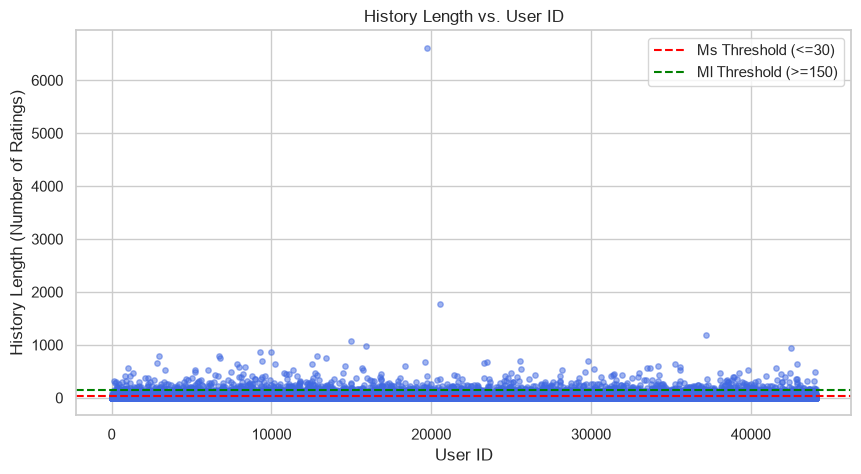

In [17]:
plt.figure(figsize=(10, 5))
plt.scatter(user_profiles["user_id"], user_profiles["history_length"], alpha=0.5, s=15, color="royalblue")
plt.xlabel("User ID")
plt.ylabel("History Length (Number of Ratings)")
plt.title("History Length vs. User ID")
plt.axhline(30, color="red", linestyle="--", label="Ms Threshold (<=30)")
plt.axhline(150, color="green", linestyle="--", label="Ml Threshold (>=150)")
plt.legend()
plt.show()

In [18]:
# Filter the users to those who have between 100 and 200 ratings
target_users_df = user_profiles[
    (user_profiles["history_length"] >= 100) & 
    (user_profiles["history_length"] <= 200)
].copy()

In [19]:
def batch_user_history(user_history, batch_size=30):
    """
    Chunks a user's interaction history into sequential 
    batches of size `batch_size` based on existing order.
    """
    return [
        user_history[i : i + batch_size] 
        for i in range(0, len(user_history), batch_size)
    ]

# Apply sequential batching to target 200 users
target_users_df["batches"] = target_users_df["history"].apply(lambda h: batch_user_history(h, batch_size=30))
target_users_df["num_batches"] = target_users_df["batches"].apply(len)

# Verify first user's batches
sample = target_users_df.iloc[0]
print(f"User ID: {sample['user_id']}")
print(f"Total Interactions: {sample['history_length']}")
print(f"Total Batches (size 30): {sample['num_batches']}")
print(f"First Batch Movie Count: {len(sample['batches'][0])}")

User ID: 144
Total Interactions: 145
Total Batches (size 30): 5
First Batch Movie Count: 30


# Step 1: Persona Summarization (Distillation via LLM)

In [20]:
# 1. Distill Ms prompts per batch
def generate_ms_prompts(user_batches):
    ms_prompts = []
    for idx, batch in enumerate(user_batches):
        movie_lines = [
            f"- {m['clean_title']} ({int(m['year']) if pd.notnull(m['year']) else 'N/A'}): {m['rating']}★ [{', '.join(m['genre_list'])}]"
            for m in batch
        ]
        prompt = f"Batch {idx+1} Short Context (Ms):\n" + "\n".join(movie_lines)
        ms_prompts.append(prompt)
    return ms_prompts

# Apply to your target dataset
target_users_df["ms_prompts"] = target_users_df["batches"].apply(generate_ms_prompts)
#target_users_df["ml_prompt"] = target_users_df["history"].apply(generate_ml_prompt)

# Print verification for User 144
sample_user = target_users_df.iloc[0]
print(f"User ID: {sample_user['user_id']}") 
print(f"Generated Ms Prompts (Batches): {len(sample_user['ms_prompts'])}")


User ID: 144
Generated Ms Prompts (Batches): 5


In [73]:
from tqdm import tqdm
def query_openai(prompt: str) -> str:
    """Queries OpenAI synchronously."""
    client = OpenAI(api_key=openai_api_key)
    
    # Removed 'await'
    response = client.chat.completions.create(
        model="gpt-4o-2024-11-20",
        messages=[
            {"role": "system", "content": "You are a helpful assistant."},
            {"role": "user", "content": prompt}
        ]
    )
    return response.choices[0].message.content


def build_batch_prompt(batch: list, batch_idx: int, profile: list) -> str:
    movie_lines = [
        f"- {m['clean_title']} ({int(m['year']) if pd.notnull(m['year']) else 'N/A'}): {m['rating']}★ [{', '.join(m['genre_list'])}]"
        for m in batch
    ]
    formatted_movies = "\n".join(movie_lines)
    currentProfileSummary= "\n".join([f"{summary}," for i, summary in enumerate(profile)])
    return f"""You are an expert movie taste analyst.
You are incrementally refining a user's overall movie taste profile as new chronological viewing data becomes available.

EXISTING USER PROFILE:
{currentProfileSummary}

NEW CHRONOLOGICAL VIEWING BATCH #{batch_idx + 1}:
{formatted_movies}

TASK:
Using the NEW viewing history above, update and refine the EXISTING USER PROFILE. 
- If the new batch confirms existing preferences, reinforce them.
- If the new batch introduces new genres, shift in rating habits, or stylistic trends, integrate those updates smoothly.
- Avoid referencing "this batch", "batch #{batch_idx + 1}", or "the new data". Write a continuous, cohesive synthesis of the user's current overall profile in 2-3 sentences.

REFINED USER PROFILE:"""


In [74]:
 # Process a single target user for testing
single_user = target_users_df.iloc[0]
user_batches = single_user["batches"]

batch_summaries = []


In [75]:
# 1. Distill each batch for the single user
batch_summaries = []
for b_idx, batch in enumerate(user_batches):
    b_prompt = build_batch_prompt(batch, b_idx, batch_summaries)
    #print(b_prompt)
    #print("*"*50)
    summary = query_openai(b_prompt)
    batch_summaries.append(summary)



You are an expert movie taste analyst.
You are incrementally refining a user's overall movie taste profile as new chronological viewing data becomes available.

EXISTING USER PROFILE:


NEW CHRONOLOGICAL VIEWING BATCH #1:
- Arrival (2016): 4.5★ [Sci-Fi]
- The Accountant (2016): 3.5★ [Crime, Drama, Thriller]
- Dunkirk (2017): 4.5★ [Action, Drama, Thriller, War]
- Mister Пронька (1991): 3.5★ [Animation]
- Paperman (2012): 4.0★ [Animation, Comedy, Romance]
- Isle of Dogs (2018): 4.0★ [Animation, Comedy]
- Baby Driver (2017): 4.5★ [Action, Crime, Thriller]
- Big Hero 6 (2014): 4.0★ [Action, Animation, Comedy]
- Star Wars: Episode VII - The Force Awakens (2015): 3.5★ [Action, Adventure, Fantasy, Sci-Fi, IMAX]
- Grand Budapest Hotel, The (2014): 5.0★ [Comedy, Drama]
- Inside Out (2015): 5.0★ [Adventure, Animation, Children, Comedy, Drama, Fantasy]
- Bridge of Spies (2015): 4.0★ [Drama, Thriller]
- Liberation: The Fire Bulge (1970): 4.0★ [Drama, War]
- War for the Planet of the Apes (2017): 5

In [77]:
(batch_summaries)   

['The user has a strong appreciation for emotionally resonant, visually striking films across a range of genres, with a notable preference for animation, drama, and nuanced storytelling in both live-action and animated formats. They gravitate towards films that blend creativity with depth, often rating highly those that explore serious themes, moral complexity, or human resilience (e.g., "War for the Planet of the Apes," "Your Name."). Additionally, they show a consistent enthusiasm for innovative sci-fi, gripping thrillers, and well-crafted action, while also enjoying occasional doses of sophisticated comedy and imaginative fantasy.',
 'The user has a profound appreciation for emotionally resonant and visually compelling films that emphasize nuanced storytelling and thematic depth, often exploring human resilience, moral complexity, or poignant relationships. Their preferences span a diverse range of genres, with a strong affinity for animation, drama, well-crafted action, and thought

## Creating user profile for this user

In [78]:
current_user_profile=batch_summaries[-1]

In [79]:
current_user_profile

'The user has a profound appreciation for emotionally resonant, visually compelling, and narratively nuanced films, consistently gravitating toward stories that explore human resilience, moral complexity, and poignant relationships. They exhibit a strong passion for animation, drama, and thought-provoking sci-fi, alongside a marked enthusiasm for gripping thrillers, war dramas, and richly stylized fantasy. Additionally, they show a growing inclination for character-driven romances, sophisticated comedies, and inventive narratives that balance depth with creativity, while demonstrating an interest in compelling documentaries and films with an atmospheric or experimental edge.'

In [82]:
sample

user_id                                                         144
history_length                                                  145
history           [{'movie_id': 5946, 'clean_title': 'Arrival', ...
batches           [[{'movie_id': 5946, 'clean_title': 'Arrival',...
num_batches                                                       5
Name: 141, dtype: object

In [88]:
def build_ml_enrichment_prompt(movie_item: dict) -> str:
    """Formats a single movie dictionary item into the enrichment prompt for Ml."""
    genres = ", ".join(movie_item.get("genre_list", []))
    
    return f"""You are an expert movie taste analyst.
Given the following movie metadata and the user's rating, generate an enriched interaction statement (Ml) that explains the implicit taste preferences and rating sentiment demonstrated by this rating.

Movie Information:
- Title: {movie_item['clean_title']} ({movie_item['year']})
- Genres: {genres}
- User Rating: {movie_item['rating']} / 5.0

TASK:
Write a concise two sentences, enriched summary describing:
1. What this rating reveals about the user's affinity for this specific genre/style combination.
2. The implied sentiment driving a {movie_item['rating']}/5 rating for this title.

Enriched Movie Rating:"""

In [89]:
for movie in sample['history']:
    prompt = build_ml_enrichment_prompt(movie)
    reason = query_openai(prompt)
    movie["reason"]= reason


{'movie_id': 5946, 'clean_title': 'Arrival', 'year': 2016, 'genre_list': ['Sci-Fi'], 'rating': 4.5, 'reason': 'Your 4.5/5 rating for *Arrival* suggests a strong appreciation for thought-provoking, emotionally resonant storytelling within the Sci-Fi genre, particularly narratives that explore complex themes like communication, humanity, and existential questions. This high score implies a deep admiration for films that blend intellectual depth with evocative cinematography and nuanced performances.'}
{'movie_id': 5663, 'clean_title': 'The Accountant', 'year': 2016, 'genre_list': ['Crime', 'Drama', 'Thriller'], 'rating': 3.5, 'reason': 'Your 3.5/5 rating for *The Accountant* suggests a solid appreciation for intricate, multifaceted storytelling within the crime and thriller genres, particularly when paired with dramatic character depth and cerebral narratives. The score implies that while you found the film engaging and well-crafted, there may have been a few aspects—such as pacing or ch

In [105]:
import asyncio

def add_embeddings_to_dataset(movie_dataset: list[dict], batch_size: int = 100) -> list[dict]:
    """Extracts 'reason' fields, generates text-embedding-ada-002 embeddings in batches, 

    and attaches 'ml_embedding' back to each dictionary item.
    """
    client = OpenAI(api_key=openai_api_key)
   
    # 1. Extract all Ml strings from your dataset
    ml_texts = [item["reason"] + item['year'] for item in movie_dataset]
    
    all_embeddings = []
    
    # 2. Process in batches to stay within token & API rate limits
    for i in range(0, len(ml_texts), batch_size):
        batch_texts = ml_texts[i : i + batch_size]
        
        response = client.embeddings.create(
            model="text-embedding-ada-002",
            input=batch_texts
        )
        
        # Extract embeddings in the exact order returned
        batch_embeddings = [data.embedding for data in response.data]
        all_embeddings.extend(batch_embeddings)
        
    # 3. Attach the vector embedding back to each item in the original dataset
    for item, embedding in zip(movie_dataset, all_embeddings):
        item["ml_embedding"] = embedding
        
    return movie_dataset

In [103]:
add_embeddings_to_dataset(sample['history'])

[{'movie_id': 5946,
  'clean_title': 'Arrival',
  'year': 2016,
  'genre_list': ['Sci-Fi'],
  'rating': 4.5,
  'reason': 'Your 4.5/5 rating for *Arrival* suggests a strong appreciation for thought-provoking, emotionally resonant storytelling within the Sci-Fi genre, particularly narratives that explore complex themes like communication, humanity, and existential questions. This high score implies a deep admiration for films that blend intellectual depth with evocative cinematography and nuanced performances.',
  'ml_embedding': [0.014983969740569592,
   -0.02227914333343506,
   0.005277847405523062,
   -0.039519891142845154,
   -0.006137261167168617,
   -0.001912358682602644,
   -0.02532317116856575,
   -0.03295948728919029,
   -0.039047542959451675,
   -0.010549134574830532,
   -0.0023453456815332174,
   0.02561182901263237,
   -0.018828367814421654,
   -0.013284824788570404,
   -0.0031293141655623913,
   0.011670964770019054,
   0.042616404592990875,
   -0.0057994001545012,
   0.0037

[{'movie_id': 5946,
  'clean_title': 'Arrival',
  'year': 2016,
  'genre_list': ['Sci-Fi'],
  'rating': 4.5,
  'reason': 'Your 4.5/5 rating for *Arrival* suggests a strong appreciation for thought-provoking, emotionally resonant storytelling within the Sci-Fi genre, particularly narratives that explore complex themes like communication, humanity, and existential questions. This high score implies a deep admiration for films that blend intellectual depth with evocative cinematography and nuanced performances.',
  'ml_embedding': [0.014983969740569592,
   -0.02227914333343506,
   0.005277847405523062,
   -0.039519891142845154,
   -0.006137261167168617,
   -0.001912358682602644,
   -0.02532317116856575,
   -0.03295948728919029,
   -0.039047542959451675,
   -0.010549134574830532,
   -0.0023453456815332174,
   0.02561182901263237,
   -0.018828367814421654,
   -0.013284824788570404,
   -0.0031293141655623913,
   0.011670964770019054,
   0.042616404592990875,
   -0.0057994001545012,
   0.0037

# Fine tuninng a SLM with the embeddings 

In [109]:
import torch
from transformers import AutoModelForCausalLM, AutoConfig, AutoTokenizer

model_id = "microsoft/Phi-3-mini-4k-instruct"

In [111]:
config = AutoConfig.from_pretrained(model_id, trust_remote_code=True)
tokenizer = AutoTokenizer.from_pretrained(model_id)
# Patch 'type' back into the rope_scaling dict if it's missing
model = AutoModelForCausalLM.from_pretrained(
    model_id,
    device_map="auto",
    torch_dtype=torch.bfloat16,
    trust_remote_code=False, 
)

Loading weights:   0%|          | 0/195 [00:01<?, ?it/s]

generation_config.json:   0%|          | 0.00/181 [00:00<?, ?B/s]